# 🏨Hotel Bookings Cancellation Prediction
**Quick summary of what I did in this notebook:**<br>
1. Exploratory data analysis to get to know the data and clean up data
    - dealing with categorical variables 
        - one-hot encoding (get dummies) for variables with not too many categories, or when a couple categories are more prevelant than the rest (like 'country' or 'agent')
    - dealing with missing values
        - fill NaN with 0 if there're not too many missing values. I did that for 'children' since there's only 4 missing values.
        - just ignore if there are too many missing values (like 'company')
2. Variable selection
    - I did it based on understanding of the variables and didn't do too much with it. Details on excluded variables
        - 'company': too many missing values
        - 'previous_bookings_not_canceled': redundant. there's already a 'previous cancellations'
        - 'reservation_status', 'reservation_status_date': literally the outcome we're trying to predict
3. Train_test_split on my data and and fit train data into models
    - models used:
        - logistic regression, kNN, decision tree, random forest, neural network
        - normalization for kNN and neural network
    - testing different threshold for better performance scores
4. Cross validation to ensure models not overfitting
5. Compare results and pick the winning model

|Classification Method | Accuracy Score | Recall Score | Time Took |
| :---: | :---:| :---:|:---:|
|Logistic Regression | 0.77 | 0.83 | 671 ms |
|kNN | 0.84 | 0.79 | 15m|
|Decision Tree | 0.85 | 0.77 | 687 ms|
|<font color='red'>Random Forest | <font color='red'>0.89| <font color='red'>0.82 | <font color='red'>45 s|
|Neural Network | 0.81 | 0.66 | 53.2 s|

In [1]:
#general imports

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import plotly.express as px
import plotly.graph_objects as go
import plotly.offline as pyo

#set notebook mode to work in offline
pyo.init_notebook_mode()

#suppressing the warning messages
import warnings
warnings.simplefilter(action='ignore')  

#show max columns
pd.set_option('display.max_columns', None)

In [3]:
from sklearn.decomposition import PCA

In [2]:
df = pd.read_csv('hotel_bookings.csv')

#### Intial Observations & Thoughts:
- Not dropping duplicated rows: it's possible that rows can seem duplicated since there's no identifying column like ID.
- Missing values
    - country
    - agent
    - company
- Categorical columns: hotel, arrival_date_month, meal, country, market_segment, distribution_channel, reserved_room_type, assigned_room_type, deposit_type, agent, company, customer_type, reservation_status, reservation_status_date
    - to replace with 1&0/ numbers: hotel
    - to create dummies: arrival_date_month, deposit_type, cutomer_type, reservation_status, meal, market_segment, distribution_channel
    - change to datetime: reservation_status_date
    - do something else: country
    - leave as is: reserved_room_type, assigned_room_type, agent, company, 

# 🕵🏻‍♀️Exploratory Data Analysis

### Column Details
| Column Name | Descrption | Notes|
| :--- | :---| :---|
| hotel | H1 = Resort Hotel,  H2 = City Hotel | dummy for city hotel|
| <font color = 'red' > **is_canceled** | <font color = 'red'> 1 = canceled, 0 = not canceled |
| lead_time | Number of days that elapsed between the entering date of the booking into the PMS and the arrival date | keep as is|
| arrival_date_year | Year of arrival date | cancellation rate ~ 0.36 across all three years. keep as is.|
| arrival_date_month | Month of arrival date | Nov-Mar have lower cancellation rates (~32%)|
| arrival_date_week_number | Week number of year for arrival date | cancellation rate similar accorss all week number. I'll keep it as it is|
| arrival_date_day_of_month | Day of arrival date | only about 0.1 difference between max & min cancellation rate. The numbers of records are equally distributed. I'll keep it as it is|
|stays_in_weekend_nights | Number of weekend nights (Saturday or Sunday) the guest stayed or booked to stay at the hotel | keep 0, 1, 2 and the rest as '3 or more'|
|stays_in_week_nights | Number of week nights (Monday to Friday) the guest stayed or booked to stay at the hotel | split the data into 'under 5 weekday nights' and 'over 5 weekday nights'|
|adults | Number of adults | dummies for 0, 1, 2, and >2|
|children | Number of children | keep as is (numeric variable)|
|babies | Number of babies | keep as is (numeric variable)|
|meal | Type of meal booked. Categories are presented in standard hospitality meal packages: Undefined/SC – no meal package; BB – Bed & Breakfast; HB – Half board (breakfast and one other meal – usually dinner); FB – Full board (breakfast, lunch and dinner) | FB has a much higher cancellation rate (~60%). I will combine SC and Undefined and create dummies.|
country | Country of origin. Categories are represented in the ISO 3155–3:2013 format | keep PRT (Portugal) and GBR (UK/Great Brittain) and the rest as 'others'|
|market_segment | Market segment designation. In categories, the term “TA” means “Travel Agents” and “TO” means “Tour Operators” | I will keep 'Online TA', 'Offline TA/TO', 'Direct', 'Groups' and consolidate the rest as 'others'|
distribution_channel | Booking distribution channel. The term “TA” means “Travel Agents” and “TO” means “Tour Operators” | Keep 'Direct' and 'TA/TO' and the rest as 'others'|
|is_repeated_guest | 1 = repeated guest, 0 = not | keep as is|
|previous_cancellations | Number of previous bookings that were cancelled by the customer prior to the current booking | cancellation rate high at 1. convert to binary. |
|previous_bookings_not_canceled | Number of previous bookings not cancelled by the customer prior to the current booking | do nothing. might not need this.|
|reserved_room_type | Code of room type reserved. Code is presented instead of designation for anonymity reasons. | keep A & D, have the rest as 'others'.|
|assigned_room_type | Code for the type of room assigned to the booking. Sometimes the assigned room type differs from the |reserved room type due to hotel operation reasons (e.g. overbooking) or by customer request. Code is presented instead of designation for anonymity reasons. | keep A & D, have the rest as 'others'.|
|booking_changes | Number of changes/amendments made to the booking from the moment the booking was entered on the PMS until the moment of | 0 booking changes weirdly have the highest cancellation rate. I think I'm going to convert this into binary as well since 0 also have the most record counts.|
|deposit_type | Indication on if the customer made a deposit to guarantee the booking. This variable can assume three categories: No Deposit – no deposit was made; Non Refund – a deposit was made in the value of the total stay cost; Refundable – a deposit was made with a value under the total cost of stay. | create dummies for all three categories|
|agent | ID of the travel agency that made the booking | keep 9, 240 and the rest as 'others'|
|company | ID of the company/entity that made the booking or responsible for paying the booking. ID is presented instead of designation for anonymity reasons | might not include in models. if it were inlcuded, will keep 40 and 223 and the rest as 'others'|
|days_in_waiting_list | Number of days the booking was in the waiting list before it was confirmed to the customer | Not much insights when looking at the cancellation rate with each number of days in waiting list. keep as is (numeric)|
|customer_type | Type of booking, assuming one of four categories: Contract - when the booking has an allotment or other type of contract associated to it; Group – when the booking is associated to a group; Transient – when the booking is not part of a group or contract, and is not associated to other transient booking; Transient-party – when the booking is transient, but is associated to at least other transient booking | dummies for all four|
|adr | Average Daily Rate as defined by dividing the sum of all lodging transactions by the total number of staying nights | keep as is|
|required_car_parking_spaces | Number of car parking spaces required by the customer | convert to binary|
total_of_special_requests | Number of special requests made by the customer (e.g. twin bed or high floor) | convert to binary
|reservation_status | Reservation last status, assuming one of three categories: Canceled – booking was canceled by the customer; Check-Out – customer has checked in but already departed; No-Show – customer did not check-in and did inform the hotel of the reason why | not using this becuase it's literally the outcome we're predicting|
|reservation_status_date | Date at which the last status was set. This variable can be used in conjunction with the ReservationStatus to understand when was the booking canceled or when did the customer checked-out of the hotel | not using this one either same reason as reservation status|

In [4]:
df.corr()['is_canceled']

is_canceled                       1.000000
lead_time                         0.293123
arrival_date_year                 0.016660
arrival_date_week_number          0.008148
arrival_date_day_of_month        -0.006130
stays_in_weekend_nights          -0.001791
stays_in_week_nights              0.024765
adults                            0.060017
children                          0.005048
babies                           -0.032491
is_repeated_guest                -0.084793
previous_cancellations            0.110133
previous_bookings_not_canceled   -0.057358
booking_changes                  -0.144381
agent                            -0.083114
company                          -0.020642
days_in_waiting_list              0.054186
adr                               0.047557
required_car_parking_spaces      -0.195498
total_of_special_requests        -0.234658
Name: is_canceled, dtype: float64

- highest postive correlation: lead_time, previous_cancellations
- highest negavtive correlation: total_of_special_requests, required_car_parking_spaces

>*I copied how the sample codes did here. I think it's a neat and clean way to check correlation coefficients. However, the highest correlation is only -0.23...the linear relationships might not be strong but it can be used as a reference.* 

### Deep dive into each column!
I am only presenting the column insights that I found interesting. Please reference to the Column Details table for columns not included below for more notes!

hotel
City Hotel      0.417270
Resort Hotel    0.277634
Name: is_canceled, dtype: float64


<AxesSubplot:xlabel='hotel', ylabel='count'>

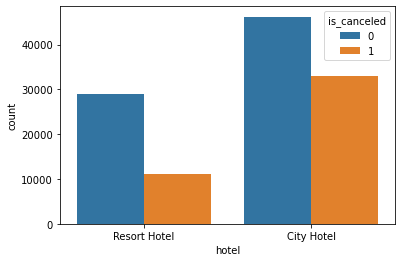

In [5]:
#'hotel'
print(df.groupby(['hotel']).sum()['is_canceled']/df.groupby(['hotel']).count()['is_canceled'])
sns.countplot(x='hotel', hue='is_canceled', data=df)

- City hotel has a higher cancellation rate than resort hotel...I will further create a dummy variable for when the reservation is made at a city hotel.

In [6]:
#'lead_time'
px.histogram(df, x='lead_time', color='is_canceled', nbins=30)

- Cancellations happen the most when the booking was done less than 50 days before cheking in. The counts gradually decline though. I'll keep it as it is since it's numeric and see what happens.

In [7]:
#'arrival_date_month'
print(df.groupby(['arrival_date_month']).sum()['is_canceled']/df.groupby(['arrival_date_month']).count()['is_canceled'])

arrival_date_month
April        0.407972
August       0.377531
December     0.349705
February     0.334160
January      0.304773
July         0.374536
June         0.414572
March        0.321523
May          0.396658
November     0.312334
October      0.380466
September    0.391702
Name: is_canceled, dtype: float64


- Months with lower cancellation rate: December, February, January, March, November (**winter months**). I'll split into winter months and not winter months.

In [4]:
#'stays_in_weekend_nights'
print(df.groupby(['stays_in_week_nights']).sum()['is_canceled']/df.groupby(['stays_in_week_nights']).count()['is_canceled'])

stays_in_week_nights
0     0.250229
1     0.324348
2     0.441575
3     0.382110
4     0.365471
5     0.348560
6     0.388259
7     0.313897
8     0.335366
9     0.411255
10    0.284749
11    0.625000
12    0.547619
13    0.407407
14    0.885714
15    0.505882
16    0.687500
17    0.500000
18    0.833333
19    0.659091
20    0.414634
21    0.733333
22    1.000000
24    1.000000
25    0.000000
26    0.000000
30    0.200000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
40    0.500000
41    0.000000
42    0.000000
50    0.000000
Name: is_canceled, dtype: float64


In [9]:
#'children'
df['children'].value_counts()

0.0     110796
1.0       4861
2.0       3652
3.0         76
10.0         1
Name: children, dtype: int64

- The cancellation rate doesn't have much insights...BUT the records with 0 children is a lot more than the others so I'm converting 'children' to a binary variable.

In [10]:
#'meal'
df['meal'].value_counts()

BB           92310
HB           14463
SC           10650
Undefined     1169
FB             798
Name: meal, dtype: int64

In [11]:
df.groupby(['meal']).sum()['is_canceled']/df.groupby(['meal']).count()['is_canceled']

meal
BB           0.373849
FB           0.598997
HB           0.344603
SC           0.372394
Undefined    0.244654
Name: is_canceled, dtype: float64

- FB has such a high cancellation rate than others...quite interesting. I think I'm only going to consolidate SC and Undefined and create dummies for the rest.

In [12]:
#'country'
df['country'].value_counts()

PRT    48590
GBR    12129
FRA    10415
ESP     8568
DEU     7287
       ...  
BFA        1
NAM        1
NIC        1
DJI        1
MDG        1
Name: country, Length: 177, dtype: int64

- PRT (Protugual) and GBR (UK/Great Brittain) account for the most records. I will keep those two and the rest as 'others'.

In [13]:
#'market_segment'
df['market_segment'].value_counts()

Online TA        56477
Offline TA/TO    24219
Groups           19811
Direct           12606
Corporate         5295
Complementary      743
Aviation           237
Undefined            2
Name: market_segment, dtype: int64

- I will keep 'Online TA', 'Offline TA/TO', 'Direct', 'Groups' and consolidate the rest as 'others'

In [14]:
#'distribution_channel'
df['distribution_channel'].value_counts()

TA/TO        97870
Direct       14645
Corporate     6677
GDS            193
Undefined        5
Name: distribution_channel, dtype: int64

- Keep 'Direct' and 'TA/TO' and the rest as 'others'

is_repeated_guest
0    0.377851
1    0.144882
Name: is_canceled, dtype: float64


<AxesSubplot:xlabel='is_repeated_guest', ylabel='count'>

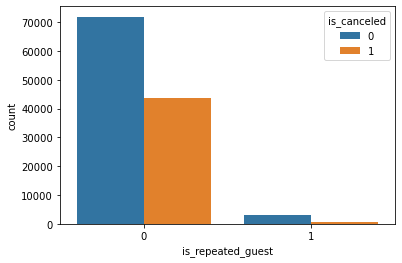

In [15]:
#'is_repeated_guest'
print(df.groupby(['is_repeated_guest']).sum()['is_canceled']/df.groupby(['is_repeated_guest']).count()['is_canceled'])
sns.countplot(x='is_repeated_guest', hue='is_canceled', data=df)

- There are not a lot of repeated guest.The cancellation rate is higher among non-repeated guests. I will keep this as is for now!

In [16]:
#'previous_cancellations'
df.groupby(['previous_cancellations']).sum()['is_canceled']/df.groupby(['previous_cancellations']).count()['is_canceled']

previous_cancellations
0     0.339061
1     0.944307
2     0.327586
3     0.307692
4     0.225806
5     0.105263
6     0.318182
11    0.285714
13    0.916667
14    1.000000
19    1.000000
21    1.000000
24    1.000000
25    1.000000
26    1.000000
Name: is_canceled, dtype: float64

- Cancellation rate is a lot higher when there's one previous cancellation (and also at 13). 0 have the most records but 1 have decent amount of records too (~1000). I'm going to convert this into a binary variable as well. 

In [17]:
#'reserved_room_type'
df['reserved_room_type'].value_counts()

A    85994
D    19201
E     6535
F     2897
G     2094
B     1118
C      932
H      601
P       12
L        6
Name: reserved_room_type, dtype: int64

In [18]:
#'assigned_room_type'
df['assigned_room_type'].value_counts()

A    74053
D    25322
E     7806
F     3751
G     2553
C     2375
B     2163
H      712
I      363
K      279
P       12
L        1
Name: assigned_room_type, dtype: int64

In [19]:
df.groupby(['assigned_room_type']).sum()['is_canceled']/df.groupby(['assigned_room_type']).count()['is_canceled']

assigned_room_type
A    0.444925
B    0.236708
C    0.187789
D    0.251244
E    0.252114
F    0.247134
G    0.305523
H    0.352528
I    0.013774
K    0.043011
L    1.000000
P    1.000000
Name: is_canceled, dtype: float64

- The cancellation rate is pretty similar across all reserved room type, but for assigned room type A has a slightly higher cancellation rate. A and D both account for the most records in these two columns so I'm keeping them and have the rest as 'others'.

In [22]:
#'deposit_type'
df['deposit_type'].value_counts()

No Deposit    104641
Non Refund     14587
Refundable       162
Name: deposit_type, dtype: int64

In [23]:
df.groupby(['deposit_type']).sum()['is_canceled']/df.groupby(['deposit_type']).count()['is_canceled']

deposit_type
No Deposit    0.283770
Non Refund    0.993624
Refundable    0.222222
Name: is_canceled, dtype: float64

- Non Refund has such a high cancellation rate...??? Very shocking. I'm just gonna create dummies for all of them.

In [24]:
#'agent'
df['agent'].value_counts()

9.0      31961
240.0    13922
1.0       7191
14.0      3640
7.0       3539
         ...  
304.0        1
431.0        1
278.0        1
450.0        1
114.0        1
Name: agent, Length: 333, dtype: int64

- I will keep 9, 240 as is and the rest as 'others'. 

In [25]:
#'company'
df['company'].value_counts()

40.0     927
223.0    784
67.0     267
45.0     250
153.0    215
        ... 
273.0      1
415.0      1
352.0      1
253.0      1
497.0      1
Name: company, Length: 352, dtype: int64

- I might not include this variable in the model becuase there are SO MANY missing data. But if I were to include this, I will keep 40 and 223 as is and the rest as 'others'

In [27]:
#'customer_type'
df['customer_type'].value_counts()

Transient          89613
Transient-Party    25124
Contract            4076
Group                577
Name: customer_type, dtype: int64

In [28]:
df.groupby(['customer_type']).sum()['is_canceled']/df.groupby(['customer_type']).count()['is_canceled']

customer_type
Contract           0.309617
Group              0.102253
Transient          0.407463
Transient-Party    0.254299
Name: is_canceled, dtype: float64

- There are only four categories. I'll keep all of them and create dummies. 

In [30]:
#'adr'
print('min value: ', df['adr'].min())
fig = px.histogram(df, x='adr', color='is_canceled', nbins=40)
fig.show()

min value:  -6.38


- kind of a weird variable...negative value for rate??? I'll keep it as is though.

In [31]:
#'required_car_parking_spaces'
df['required_car_parking_spaces'].value_counts()

0    111974
1      7383
2        28
3         3
8         2
Name: required_car_parking_spaces, dtype: int64

In [32]:
df.groupby(['required_car_parking_spaces']).sum()['is_canceled']/df.groupby(['required_car_parking_spaces']).count()['is_canceled']

required_car_parking_spaces
0    0.394949
1    0.000000
2    0.000000
3    0.000000
8    0.000000
Name: is_canceled, dtype: float64

- Only the bookings that don't require parking spaces have cancellations. I think I'm going to convert this into a binary as well. 

In [33]:
#'total_of_special_requests'
df.groupby(['total_of_special_requests']).sum()['is_canceled']/df.groupby(['total_of_special_requests']).count()['is_canceled']

total_of_special_requests
0    0.477204
1    0.220249
2    0.220989
3    0.178614
4    0.105882
5    0.050000
Name: is_canceled, dtype: float64

In [34]:
df['total_of_special_requests'].value_counts()

0    70318
1    33226
2    12969
3     2497
4      340
5       40
Name: total_of_special_requests, dtype: int64

- 0 speical requests have a higher rate of cancelling as it also has the most records. I think I'll convert this into a binary as well. 

### Now we know what to do with each variable, let's do the cleaning!🧽

In [50]:
#creating a new binary variable 'city_hotel'
df = pd.get_dummies(df, columns=['hotel'])
df = df.drop(columns=['hotel_Resort Hotel'])
df = df.rename(columns={'hotel_City Hotel':'city_hotel'})

In [51]:
#creating a new binary 'winter_months' from 'arrival_date_month'
df['arrival_date_month'] = df['arrival_date_month'].replace({'July':'not_winter', 'August':'not_winter', 
                                                             'September':'not_winter', 'October':'not_winter', 
                                                             'November':'winter_months', 'December':'winter_months',
                                                             'January':'winter_months', 'February':'winter_months', 
                                                             'March':'winter_months', 'April':'not_winter', 
                                                             'May':'not_winter', 'June':'not_winter'})
df = pd.get_dummies(df, columns=['arrival_date_month'])
df = df.drop(columns=['arrival_date_month_not_winter'])
df = df.rename(columns={'arrival_date_month_winter_months':'winter_months'})

In [52]:
#keep 0, 1, 2 and the rest as '3 or more' for 'stays_in_weekend_nights'
for i in df['stays_in_weekend_nights']:
    if i>2:
        df['stays_in_weekend_nights'].replace(to_replace=i, value='>3', inplace=True)

df['stays_in_weekend_nights'] = df['stays_in_weekend_nights'].astype('category')
df = pd.get_dummies(df, columns=['stays_in_weekend_nights'])
df.rename(columns={'stays_in_weekend_nights_0': '0_weekend_nights',
          'stays_in_weekend_nights_1':'1_weekend_nights',
          'stays_in_weekend_nights_2':'2_weekend_nights',
          'stays_in_weekend_nights_>3':'>3_weekend_nights'}, inplace=True)

In [53]:
#split the data into 'under 5 weekday nights' and 'over 5 weekday nights' for 'stays_in_week_nights'
for i in df['stays_in_week_nights']:
    if i>5:
        df['stays_in_week_nights'].replace(to_replace=i, value='>5_weekday_nights', inplace=True)
    else:
        df['stays_in_week_nights'].replace(to_replace=i, value='<=5_weekday_nights', inplace=True)

df = pd.get_dummies(df, columns=['stays_in_week_nights'])
df.rename(columns={'stays_in_week_nights_<=5_weekday_nights':'<=5_weekday_nights',
                  'stays_in_week_nights_>5_weekday_nights':'>5_weekday_nights'}, inplace=True)

In [54]:
#keep 1, 2 and the rest as '>2' for 'adults'
for i in df['adults']:
    if i >2:
        df['adults'].replace(to_replace=i, value='>2', inplace=True)

df = pd.get_dummies(df, columns=['adults'])
df.rename(columns={'adults_1':'1_adult',
                  'adults_2':'2_adults',
                  'adults_>2':'>2_adults'}, inplace=True)

In [55]:
#converting 'children' and 'babies' to binary
for i in df['children']:
    if i>0:
        df['children'].replace(to_replace=i, value=1, inplace=True)

for i in df['babies']:
    if i>0:
        df['babies'].replace(to_replace=i, value=1, inplace=True)

#4 missing values in 'children'. It's not a lot so I'm going to replace them with 0
df['children'] = df['children'].fillna(value=0)
df['children'] = df['children'].astype('int')

In [56]:
#combine SC & Undefined and create dummies for 'meal'
for i in df['meal']:
    if i == 'Undefined':
        df['meal'].replace(to_replace=i, value='SC', inplace=True)

df = pd.get_dummies(df, columns=['meal'])

In [57]:
#keep PRT (Portugal) and GBR (UK/Great Brittain) and the rest as 'others' for 'country'
#the missing values only account for 0.4% of the records. I'll just put them as 'others'
for i in df['country']:
    if i != 'PRT':
        if i !='GBR':
            df['country'].replace(to_replace=i, value='others', inplace=True)

df = pd.get_dummies(df, columns=['country'])

In [58]:
#keep 'Online TA', 'Offline TA/TO', 'Direct', 'Groups' and consolidate the rest as 'others' for 'market_segment'
for i in df['market_segment']:
    if i != 'Online TA':
        if i !='Offline TA/TO':
            if i != 'Groups':
                if i != 'Direct':
                    df['market_segment'].replace(to_replace=i, value='others', inplace=True)

df = pd.get_dummies(df, columns=['market_segment'])
df.rename(columns={'market_segment_Online TA':'MS_onlineTA',
                  'market_segment_Offline TA/TO':'MS_offlineTATO',
                  'market_segment_Groups':'MS_groups',
                  'market_segment_Direct':'MS_direct',
                  'market_segment_others':'MS_others'}, inplace=True)

In [59]:
#Keep 'Direct' and 'TA/TO' and the rest as 'others' for 'distribution_channel'
for i in df['distribution_channel']:
    if i != 'TA/TO':
        if i != 'Direct':
            df.replace(to_replace=i, value='others', inplace=True)
            
df = pd.get_dummies(df, columns=['distribution_channel'])
df.rename(columns={'distribution_channel_TA/TO':'DC_TATO',
                  'distribution_channel_Direct':'DC_direct',
                  'distribution_channel_others':'DC_others'}, inplace=True)

In [60]:
#convert to binary for 'previous_cancellations'
for i in df['previous_cancellations']:
    if i >0:
        df['previous_cancellations'].replace(to_replace=i, value=1, inplace=True)

In [61]:
#keep A & D, have the rest as 'others' for 'reserved_room_type' and 'assigned_room_type'
for i in df['reserved_room_type']:
    if i != 'A':
        if i != 'D':
            df['reserved_room_type'].replace(to_replace=i, value='others', inplace=True)
            
for i in df['assigned_room_type']:
    if i != 'A':
        if i != 'D':
            df['assigned_room_type'].replace(to_replace=i, value='others', inplace=True)
            
df = pd.get_dummies(df, columns=['reserved_room_type','assigned_room_type'])
df.rename(columns={'reserved_room_type_A':'reserved_room_A',
                  'reserved_room_type_D':'reserved_room_D',
                  'reserved_room_type_others':'reserved_room_others',
                   'assigned_room_type_A':'assigned_room_A',
                  'assigned_room_type_D':'assigned_room_D',
                  'assigned_room_type_others':'assigned_room_others'}, inplace=True)

In [62]:
#convert to binary for 'booking_changes'
for i in df['booking_changes']:
    if i >0:
        df['booking_changes'].replace(to_replace=i, value=1, inplace=True)

In [63]:
#creat dummies for 'deposit_type'
df = pd.get_dummies(df, columns=['deposit_type'])
df.rename(columns={'deposit_type_No Deposit':'no_deposit',
                  'deposit_type_Non Refund':'nonrefundable',
                  'deposit_type_Refundable':'refundable'}, inplace=True)

In [64]:
#keep 9, 240 and the rest as 'others' for 'agent'
#there are some missing data. I'm going to fill it as 'no agent' for now
#could've done kNN too. I'll come back to this if the result is not satisfactory

df['agent'].fillna(value='no_agent', inplace=True)

for i in df['agent']:
    if i != 9:
        if i != 240:
            if i != 'no_agent':
                df['agent'].replace(to_replace=i, value='others', inplace=True)

df = pd.get_dummies(df, columns=['agent'])
df.rename(columns={'agent_9.0':'agent_9',
                  'agent_240.0':'agent_240',
                  'agent_no_agent':'no_agent'}, inplace=True)

In [65]:
#convert to binary for 'days_in_waiting_list'
for i in df['days_in_waiting_list']:
    if i >0:
        df['days_in_waiting_list'].replace(to_replace=i, value=1, inplace=True)
        
df.rename(columns={'days_in_waiting_list':'waiting_list'}, inplace=True)

In [66]:
#get dummies for 'customer_type'
df = pd.get_dummies(df, columns=['customer_type'])
df.rename(columns={'customer_type_Transient':'customer_transient',
                  'customer_type_Transient-Party':'customer_transientP',
                  'customer_type_Contract':'customer_contract',
                  'customer_type_Group':'customer_group'}, inplace=True)

In [67]:
#convert to binary for 'required_car_parking_spaces' and 'total_of_special_requests'
for i in df['required_car_parking_spaces']:
    if i >0:
        df['required_car_parking_spaces'].replace(to_replace=i, value=i, inplace=True)

for i in df['total_of_special_requests']:
    if i>0:
        df['total_of_special_requests'].replace(to_replace=i, value=1, inplace=True)
        
df.rename(columns={'required_car_parking_spaces':'parking_space_required',
                  'total_of_speical_requests':'special_requests'}, inplace=True)

=====================================================================================================================
# ✋🏻Before going into the models...let's recap✋
- My Current DataFrame
    - **Target Variable**: 'is_canceled'
    - **Predictors**: 'lead_time', 'arrival_date_year','arrival_date_week_number', 'arrival_date_day_of_month', 'children', 'babies', 'is_repeated_guest', 'previous_cancellations', 'booking_changes', 'waiting_list', 'adr', 'parking_space_required', 'total_of_special_requests', 'city_hotel', 'winter_months', '0_weekend_nights', '1_weekend_nights', '2_weekend_nights', '>3_weekend_nights', '<=5_weekday_nights', '>5_weekday_nights', 'adults_0', '1_adult', '2_adults', '>2_adults', 'meal_BB', 'meal_FB', 'meal_HB', 'meal_SC', 'country_GBR', 'country_PRT', 'country_others', 'MS_direct', 'MS_groups', 'MS_offlineTATO', 'MS_onlineTA', 'MS_others', 'DC_direct', 'DC_TATO', 'DC_others', 'reserved_room_A', 'reserved_room_D', 'reserved_room_others', 'assigned_room_A', 'assigned_room_D', 'assigned_room_others', 'no_deposit', 'nonrefundable', 'refundable', 'agent_9', 'agent_240', 'no_agent', 'agent_others', 'customer_contract', 'customer_group', 'customer_transient', 'customer_transientP'
        - **Numeric Variable**: 'lead_time', 'arrival_date_year', 'arrival_date_week_number', 'arrival_date_day_of_month', 'adr'
    - **Excluded from predictors**: 'previous_bookings_not_canceled', 'company', 'reservation_status', 'reservation_status_date'
- My measurements
    - The goal is to detect potential cancellations so we can do something about it. Of course I would want a good **accuracy** rate, but I'm also concerned about the **recall score** (I want it high so when the actual value is 1 we didn't fail to predict it). 

In [26]:
#imports for logistic regression and kNN
from sklearn import preprocessing as prep
from sklearn.preprocessing import binarize
from sklearn.model_selection import train_test_split
from sklearn.neighbors import NearestNeighbors, KNeighborsClassifier
from sklearn.linear_model import LogisticRegression

#imports for decision tree
from sklearn import tree
from sklearn.tree import plot_tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import cross_val_score

#improts for random forest
from sklearn.ensemble import RandomForestClassifier

#imports for confusion matrix
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix

#imports for neural network
from sklearn.neural_network import MLPClassifier

====================================================================================================================

# Logistic Regression

In [68]:
#split the data
predictors = [ 'lead_time', 'arrival_date_year','arrival_date_week_number', 'arrival_date_day_of_month', 
              'children', 'babies', 'is_repeated_guest', 'previous_cancellations', 'booking_changes', 
              'waiting_list', 'adr', 'parking_space_required', 'total_of_special_requests', 'city_hotel', 
              'winter_months', '0_weekend_nights', '1_weekend_nights', '2_weekend_nights', '>3_weekend_nights', 
              '<=5_weekday_nights', '>5_weekday_nights', 'adults_0', '1_adult', '2_adults', '>2_adults', 
              'meal_BB', 'meal_FB', 'meal_HB', 'meal_SC', 'country_GBR', 'country_PRT', 'country_others', 
              'MS_direct', 'MS_groups', 'MS_offlineTATO', 'MS_onlineTA', 'MS_others', 'DC_direct', 'DC_TATO', 
              'DC_others', 'reserved_room_A', 'reserved_room_D', 'reserved_room_others', 'assigned_room_A', 
              'assigned_room_D', 'assigned_room_others', 'no_deposit', 'nonrefundable', 'refundable', 'agent_9', 
              'agent_240', 'no_agent', 'agent_others', 'customer_contract', 'customer_group', 'customer_transient', 
              'customer_transientP']
x = df[predictors]
y = df['is_canceled']

In [82]:
%%time
#fit data into the model
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.35, random_state=20)
lr = LogisticRegression().fit(x_train, y_train)

Wall time: 671 ms


- I tested out different test size (0.4, 0.3) and different random state(20, 30, 40) and all got similar scores. Model not overfitting.

In [84]:
#let's look at the performance!
y_pred_class = lr.predict(x_test)
y_pred_prob = lr.predict_proba(x_test)[:,1]

print('accuracy score: ', metrics.accuracy_score(y_test, y_pred_class).round(3))
print('recall rate: ', metrics.recall_score(y_test, y_pred_class))

accuracy score:  0.809
recall rate:  0.6617704154264268


In [71]:
#checking my naive baseline
print('Count of cancellations:')
print(y_train.value_counts())
print('\n')
print('%.2f percent of the bookings are cancelled.' %(y_train.mean()*100))
print('%.2f percent of the bookings are not cancelled.' %(100-y_train.mean()*100))

Count of cancellations:
0    48988
1    28615
Name: is_canceled, dtype: int64


36.87 percent of the bookings are cancelled.
63.13 percent of the bookings are not cancelled.


- Accuracy rate looks good considering the naive baseline. 

In [85]:
#let's test out some thresholds
threshold = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
accuracy=[]
recall=[]

for i in threshold:
    y_pred_class = binarize([y_pred_prob], threshold=i)[0]
    accuracy.append(metrics.accuracy_score(y_test, y_pred_class))
    recall.append(metrics.recall_score(y_test, y_pred_class))

dict = {'threshold':threshold,
       'accuracy':accuracy,
       'recall':recall}
result = pd.DataFrame(dict)
result

,threshold,accuracy,recall
0,0.1,0.601551,0.964152
1,0.2,0.713212,0.911156
2,0.3,0.774715,0.831241
3,0.4,0.802833,0.742720
4,0.5,0.809247,0.661770
5,0.6,0.796851,0.557655
6,0.7,0.783832,0.469522
7,0.8,0.767966,0.392196
8,0.9,0.748558,0.322570


- I think I'm going with threshold=0.3. Accuracy rate is only 0.03 lower but recall rate increases by 0.17. I think it's worth it.

In [86]:
y_pred_class = binarize([y_pred_prob], threshold=0.3)[0]
print('accuracy score: ', metrics.accuracy_score(y_test, y_pred_class).round(3))
print('recall rate: ', metrics.recall_score(y_test, y_pred_class))

# kNN

In [102]:
#normalize numeric data for kNN
norm_df = df.copy()

norm_df['lead_time'] = (norm_df['lead_time']-norm_df['lead_time'].mean())/norm_df['lead_time'].std()
norm_df['arrival_date_year']= (norm_df['arrival_date_year'] - norm_df['arrival_date_year'].mean())/norm_df['arrival_date_year'].std()
norm_df['arrival_date_week_number']= (df['arrival_date_week_number'] - df['arrival_date_week_number'].mean())/df['arrival_date_week_number'].std()
norm_df['arrival_date_day_of_month']= (df['arrival_date_day_of_month'] - df['arrival_date_day_of_month'].mean())/df['arrival_date_day_of_month'].std()
norm_df['adr']= (df['adr'] - df['adr'].mean())/df['adr'].std()

In [118]:
predictors = ['lead_time', 'arrival_date_year','arrival_date_week_number', 'arrival_date_day_of_month', 
              'children', 'babies', 'is_repeated_guest', 'previous_cancellations', 'booking_changes', 
              'waiting_list', 'adr', 'parking_space_required', 'total_of_special_requests', 'city_hotel', 
              'winter_months', '0_weekend_nights', '1_weekend_nights', '2_weekend_nights', '>3_weekend_nights', 
              '<=5_weekday_nights', '>5_weekday_nights', 'adults_0', '1_adult', '2_adults', '>2_adults', 'meal_BB', 
              'meal_FB', 'meal_HB', 'meal_SC', 'country_GBR', 'country_PRT', 'country_others', 'MS_direct', 'MS_groups', 
              'MS_offlineTATO', 'MS_onlineTA', 'MS_others', 'DC_direct', 'DC_TATO', 'DC_others', 'reserved_room_A', 
              'reserved_room_D', 'reserved_room_others', 'assigned_room_A', 'assigned_room_D', 'assigned_room_others', 
              'no_deposit', 'nonrefundable', 'refundable', 'agent_9', 'agent_240', 'no_agent', 'agent_others', 
              'customer_contract', 'customer_group', 'customer_transient', 'customer_transientP']
x_norm = norm_df[predictors]
y = norm_df['is_canceled']

x_train_norm, x_test_norm, y_train, y_test = train_test_split(x_norm, y, test_size=0.35, random_state=20)

In [ ]:
%%time
# kNN
# Train a classifier for different values of k
results = []
for k in range(1,30,2):
    knn = KNeighborsClassifier(n_neighbors=k).fit(x_train_norm, y_train)
    knn_y_pred_class = knn.predict(x_test_norm)
    results.append({'k':k,
                    'accuracy':metrics.accuracy_score(y_test, knn_y_pred_class),
                   'recall':metrics.recall_score(y_test, knn_y_pred_class)})

knn_y_pred_class = knn.predict(x_test_norm)
knn_y_pred_prob = knn.predict_proba(x_test_norm)[:,1]

# Convert results to Pandas dataframe
results = pd.DataFrame(results)
results

- It seems like k=1 has the best accuracy score and recall score.

In [120]:
knn = KNeighborsClassifier(n_neighbors=1).fit(x_train_norm, y_train)
metrics.accuracy_score(y_test, knn_y_pred_class)

0.8390887118003206

In [123]:
#test out different threshold for knn
threshold = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
accuracy=[]
recall=[]

for i in threshold:
    knn_y_pred_class = binarize([knn_y_pred_prob], threshold=i)[0]
    accuracy.append(metrics.accuracy_score(y_test, knn_y_pred_class))
    recall.append(metrics.recall_score(y_test, knn_y_pred_class))

dict = {'threshold':threshold,
       'accuracy':accuracy,
       'recall':recall}
knn_result = pd.DataFrame(dict)
knn_result

,threshold,accuracy,recall
0,0.1,0.839974,0.794487
1,0.2,0.839974,0.794487
2,0.3,0.839974,0.794487
3,0.4,0.839974,0.794487
4,0.5,0.839974,0.794487
5,0.6,0.839974,0.794487
6,0.7,0.839974,0.794487
7,0.8,0.839974,0.794487
8,0.9,0.839974,0.794487


- Scores are the exact same across all thresholds...I'll keep the default threshold.

# Decision Tree

In [124]:
%%time
#fit the data into the decision tree model
dt = DecisionTreeClassifier(random_state=2)
dt.fit(x_train,y_train)

Wall time: 687 ms


DecisionTreeClassifier(random_state=2)

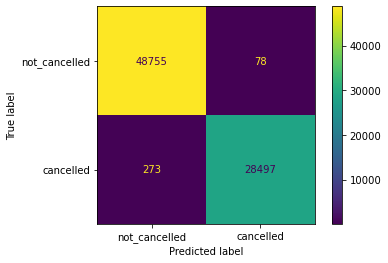

In [99]:
plot_confusion_matrix(dt,x_train,y_train,
                      display_labels=['not cancelled','cancelled'])

In [129]:
#let's do some pruning
path = dt.cost_complexity_pruning_path(x_train, y_train)
ccp_alphas = path.ccp_alphas
ccp_alphas = ccp_alphas[:-1]
len(ccp_alphas)

4141

- borrowed the codes from CarvanaKicks here. Very clean and I like the visualization.
- not testing all 4141 alphas...I'll test one every 80.

In [130]:
dts = []

for ccp_alpha in ccp_alphas[0::80]:
    dt = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
    dt.fit(x_train,y_train)
    dts.append(dt)

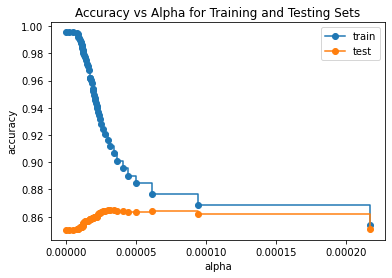

In [132]:
train_scores = [dt.score(x_train,y_train) for dt in dts]
test_scores = [dt.score(x_test,y_test) for dt in dts]

fix, ax = plt.subplots()
ax.set_xlabel('alpha')
ax.set_ylabel('accuracy')
ax.set_title("Accuracy vs Alpha for Training and Testing Sets")
ax.plot(ccp_alphas[0::80], train_scores, marker='o', label="train", drawstyle="steps-post")
ax.plot(ccp_alphas[0::80], test_scores, marker='o', label="test",drawstyle='steps-post')
ax.legend()
plt.show()

- The highest accuracy that the test data achieve is around **0.865**. 
- The alpha that achieves the highest accuracy is **0.0003**.

In [136]:
dt = DecisionTreeClassifier(random_state=30, ccp_alpha=0.0003)
dt.fit(x_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0003, random_state=30)

<AxesSubplot:xlabel='tree'>

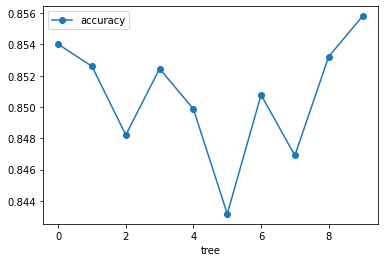

In [139]:
#Cross Validation to make sure the result wasn't unique to this test set
#borrowed the codes from decision tree recording

#10-fold validation
scores = cross_val_score(dt_cv, x_train, y_train, cv=10)
cv_df = pd.DataFrame(data={'tree':range(10),
                          'accuracy': scores})
cv_df.plot(x='tree', y='accuracy', marker='o')

-The difference in accuracy LOOKS drastic but there's really only 0.01 of difference from the highest to lowest (0.856 ~ 0.844). I think this is pretty good!

<Figure size 7200x4800 with 0 Axes>

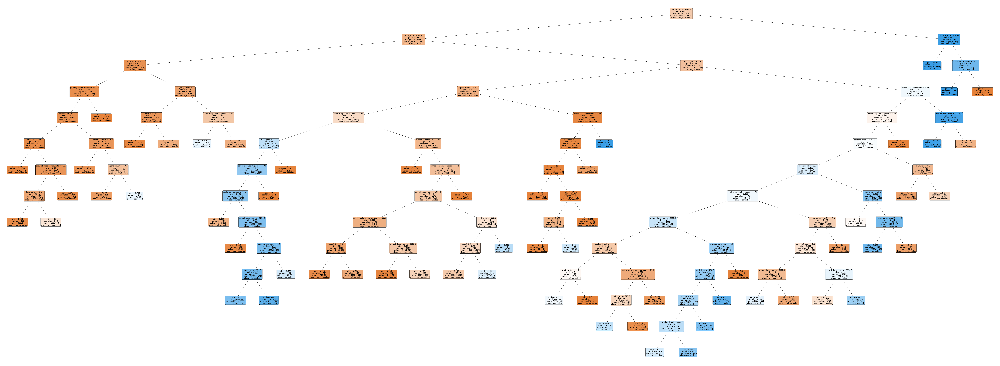

In [138]:
#let's see our pruned tree!
plt.figure(dpi=1200)
fig = plt.figure(figsize=(200,75))
plot_tree(dt,
          filled=True,
          rounded=True,
          class_names=['not_cancelled','cancelled'],
          feature_names=x_train.columns
         );

In [146]:
#check the accuracy score and recall score
dt_y_pred_prob = dt.predict_proba(x_test)[:,1]
dt_y_pred_class = binarize([dt_y_pred_prob],threshold=0.5)[0]
confusion=confusion_matrix(y_test, dt_y_pred_class)

print('accuracy score: ', metrics.accuracy_score(y_test, dt_y_pred_class).round(2))
print('recall score: ', metrics.recall_score(y_test, dt_y_pred_class).round(2))

accuracy score:  0.85
recall score:  0.77


# Random Forest

In [153]:
%%time
rf = RandomForestClassifier(n_estimators=500, max_depth=30, random_state=0)
rf.fit(x_train,y_train)

rf_y_pred_prob = rf.predict_proba(x_test)[:,1]
rf_y_pred_class = binarize([rf_y_pred_prob],threshold=0.5)[0]
confusion=confusion_matrix(y_test, rf_y_pred_class)

print('accuracy score: ', metrics.accuracy_score(y_test, rf_y_pred_class).round(2))
print('recall score: ', metrics.recall_score(y_test, rf_y_pred_class).round(2))

accuracy score:  0.89
recall score:  0.82
Wall time: 45 s


- As I inscreases the number of estimators and depth, the accuracy score and recall score both increases. This might be the winnig model.

# Neural Network

In [172]:
%%time
nn = MLPClassifier(hidden_layer_sizes=(40), max_iter=1000, activation='tanh')
nn.fit(x_train_norm, y_train)

Wall time: 1min 4s


MLPClassifier(activation='tanh', hidden_layer_sizes=40, max_iter=1000)

In [173]:
nn_y_pred_prob = nn.predict_proba(x_test_norm)[:,1]
nn_y_pred_class = binarize([y_pred_prob],threshold=0.5)[0]
confusion=confusion_matrix(y_test, nn_y_pred_class)

print('accuracy score: ', metrics.accuracy_score(y_test, nn_y_pred_class).round(2))
print('recall rate: ', metrics.recall_score(y_test, nn_y_pred_class).round(2))

accuracy score:  0.81
recall rate:  0.66


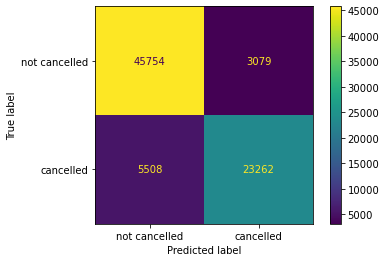

In [165]:
plot_confusion_matrix(nn, x_train_norm, y_train,
                      display_labels=['not cancelled','cancelled'])

- I've tested out different sizes of first layers and second layers and two layers combined, and the accuracy score stays the exact same. I've also tried different activation method and I see no improvements.